<a href="https://colab.research.google.com/github/Ihoroderii/colab/blob/main/Copy_of_c%2B%2B_run_01_30_2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%%writefile helloworld.cpp
#include <iostream>
#include <vector>

int main() {
  std::vector<int> vec;
  std::cout << "hello world" << std::endl;
  return 1;
}


Overwriting helloworld.cpp


In [ ]:
! g++ helloworld.cpp -o prog

In [ ]:
! ./prog

hello world


In [ ]:
# prompt: generate code to run a model from huggen face

!pip install transformers

from transformers import pipeline

classifier = pipeline("sentiment-analysis")

result = classifier("We are very happy to show you the 🤗 Transformers library.")

result


In [ ]:
! g++ --version

g++ (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
Copyright (C) 2021 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
! make --version

GNU Make 4.3
Built for x86_64-pc-linux-gnu
Copyright (C) 1988-2020 Free Software Foundation, Inc.
License GPLv3+: GNU GPL version 3 or later <http://gnu.org/licenses/gpl.html>
This is free software: you are free to change and redistribute it.
There is NO WARRANTY, to the extent permitted by law.


In [ ]:
! cmake --version

cmake version 3.31.2

CMake suite maintained and supported by Kitware (kitware.com/cmake).


In [ ]:
! mkdir build

In [ ]:
! cd ./build && cmake

In [6]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from webdriver_manager.chrome import ChromeDriverManager
import time
import os
import requests
from bs4 import BeautifulSoup

# Set up Chrome options
chrome_options = Options()
chrome_options.add_argument("--enable-javascript")
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--no-sandbox")
chrome_options.add_argument("--disable-dev-shm-usage")
chrome_options.add_argument("user-agent=Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36")
chrome_options.add_argument("--headless=new")  # Run in headless mode

# Initialize the WebDriver
driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=chrome_options)

# Open the page
manga_url = "https://mangalib.org/ru/7580--i-alone-level-up/read/v1/c84?bid=6639&p=7"
driver.get(manga_url)

# Wait for the page to fully load
try:
    # Wait for a specific element to load (e.g., the first image)
    WebDriverWait(driver, 10).until(
        EC.presence_of_element_located((By.TAG_NAME, "img"))
    )
except Exception as e:
    print(f"Error waiting for page to load: {e}")
    driver.quit()
    exit()

# Extract page source
page_source = driver.execute_script("return document.documentElement.outerHTML;")

# Parse with BeautifulSoup
soup = BeautifulSoup(page_source, 'html.parser')

# Extract images
image_tags = soup.find_all('img')
image_urls = [img['src'] for img in image_tags if 'src' in img.attrs]

# Download images
os.makedirs('manga_images', exist_ok=True)
for i, url in enumerate(image_urls):
    try:
        response = requests.get(url)
        response.raise_for_status()  # Raise an error for bad status codes
        with open(f'manga_images/page_{i + 1}.jpg', 'wb') as f:
            f.write(response.content)
        print(f"Downloaded image {i + 1}/{len(image_urls)}")
    except Exception as e:
        print(f"Failed to download image {i + 1}: {e}")

# Close the browser
driver.quit()



Downloaded image 1/4
Downloaded image 2/4
Downloaded image 3/4
Downloaded image 4/4


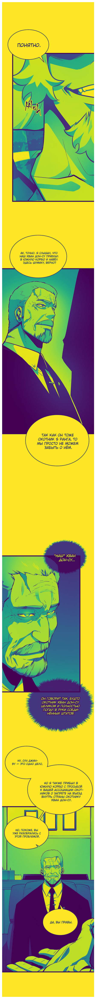

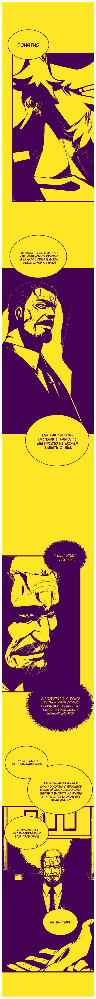

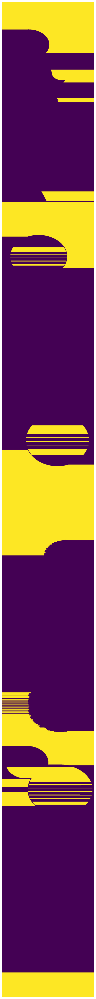

Saved: manga_images/split_parts/manga_part_1.jpg
Saved: manga_images/split_parts/manga_part_2.jpg
Saved: manga_images/split_parts/manga_part_3.jpg
Saved: manga_images/split_parts/manga_part_4.jpg
Saved: manga_images/split_parts/manga_part_5.jpg
Saved: manga_images/split_parts/manga_part_6.jpg
Saved: manga_images/split_parts/manga_part_7.jpg
Saved: manga_images/split_parts/manga_part_8.jpg
Saved: manga_images/split_parts/manga_part_9.jpg
Saved: manga_images/split_parts/manga_part_10.jpg
Saved: manga_images/split_parts/manga_part_11.jpg
Saved: manga_images/split_parts/manga_part_12.jpg
Saved: manga_images/split_parts/manga_part_13.jpg


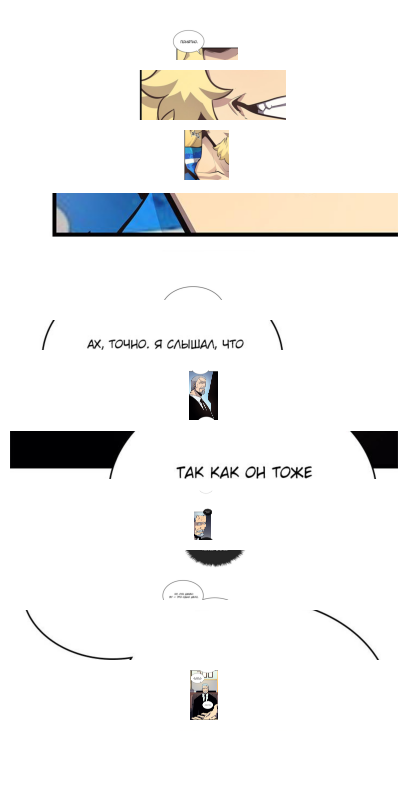

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Step 1: Load the image
image_path = "manga_images/page_1.jpg"
image = cv2.imread(image_path)

# Step 2: Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(100,60))
plt.imshow(gray)
plt.axis('off')  # Hide axes
plt.show()

# Step 3: Invert colors so panels are white and gaps are black
#inverted = cv2.bitwise_not(gray)

#plt.figure(figsize=(100,60))
#plt.figure(figsize=(100,60))
#plt.imshow(inverted)
#plt.axis('off')  # Hide axes
#plt.show()

# Step 4: Apply a binary threshold to highlight white spaces
_, binary = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
plt.figure(figsize=(100,60))
plt.imshow(binary)
plt.axis('off')  # Hide axes
plt.show()

# Step 5: Detect horizontal gaps using morphological operations
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (200, 1))  # Detect long horizontal lines
detected_lines = cv2.morphologyEx(binary, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)
plt.figure(figsize=(100,60))
plt.imshow(detected_lines)
plt.axis('off')  # Hide axes
plt.show()

# Step 6: Find contours of the detected gaps
contours, _ = cv2.findContours(detected_lines, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Step 7: Get the Y-coordinates of the detected white spaces
gap_positions = sorted([cv2.boundingRect(c)[1] for c in contours])  # Sort by vertical position

# Step 8: Split the manga image based on detected gaps
split_images = []
prev_y = 0
for y in gap_positions:
    if y - prev_y > 50:  # Ignore very small gaps (noise)
        part = image[prev_y:y, :]
        split_images.append(part)
    prev_y = y

# Add the last section of the image
split_images.append(image[prev_y:, :])

# Step 9: Save split images in the same folder
output_folder = "manga_images/split_parts/"
os.makedirs(output_folder, exist_ok=True)

for i, img in enumerate(split_images):
    output_path = os.path.join(output_folder, f"manga_part_{i+1}.jpg")
    cv2.imwrite(output_path, img)
    print(f"Saved: {output_path}")

# Step 10: Display the split parts
fig, axes = plt.subplots(len(split_images), 1, figsize=(5, 10))
for i, img in enumerate(split_images):
    axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i].axis('off')

plt.show()


Saved: manga_images/split_parts/manga_part_1.jpg
Saved: manga_images/split_parts/manga_part_2.jpg
Saved: manga_images/split_parts/manga_part_3.jpg
Saved: manga_images/split_parts/manga_part_4.jpg
Saved: manga_images/split_parts/manga_part_5.jpg


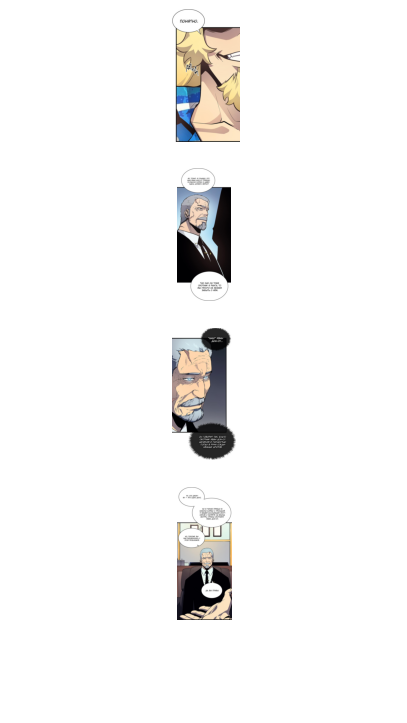

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Step 1: Load the image
image_path = "manga_images/page_1.jpg"
image = cv2.imread(image_path)

# Step 2: Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 3: Apply a binary threshold to highlight white spaces
_, binary = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)

# Step 4: Detect full white horizontal lines
full_white_rows = []
for y in range(binary.shape[0]):  # Iterate through each row
    if np.all(binary[y, :] == 255):  # Check if all pixels in the row are white
        full_white_rows.append(y)

# Step 5: Split the image based on detected full white rows
split_images = []
prev_y = 0
for y in full_white_rows:
    if y - prev_y > 10:  # Ignore very small gaps (noise)
        part = image[prev_y:y, :]
        split_images.append(part)
    prev_y = y

# Add the last section of the image
split_images.append(image[prev_y:, :])

# Step 6: Save split images in the same folder
output_folder = "manga_images/split_parts/"
os.makedirs(output_folder, exist_ok=True)

for i, img in enumerate(split_images):
    output_path = os.path.join(output_folder, f"manga_part_{i+1}.jpg")
    cv2.imwrite(output_path, img)
    print(f"Saved: {output_path}")

# Step 7: Display the split parts
fig, axes = plt.subplots(len(split_images), 1, figsize=(5, 10))
for i, img in enumerate(split_images):
    axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i].axis('off')

plt.show()

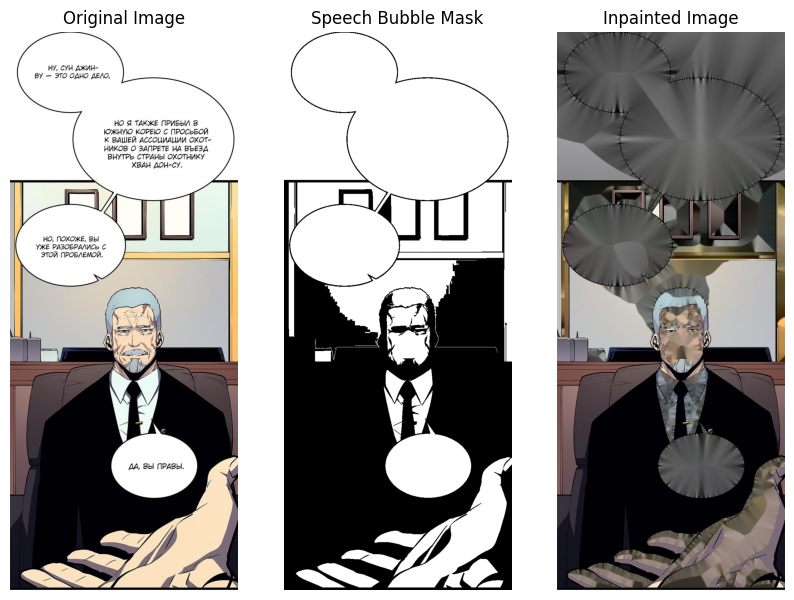

Saved inpainted image: manga_panel_inpainted.jpg


In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Load the manga panel image
image_path = "manga_images/split_parts/manga_part_4.jpg"
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for display

# Step 2: Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 3: Apply a binary threshold to isolate white regions (speech bubbles)
_, binary = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)

# Step 4: Find contours of the white regions
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Step 5: Create a mask for the speech bubbles
mask = np.zeros_like(gray)
for contour in contours:
    # Filter contours based on area (to avoid small noise)
    if cv2.contourArea(contour) > 1000:  # Adjust this threshold as needed
        cv2.drawContours(mask, [contour], -1, 255, thickness=cv2.FILLED)

# Step 6: Inpaint the speech bubble regions
inpainted_image = cv2.inpaint(image, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Step 7: Display the results
plt.figure(figsize=(10, 10))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title("Original Image")
plt.axis('off')

# Mask (speech bubbles)
plt.subplot(1, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title("Speech Bubble Mask")
plt.axis('off')

# Inpainted image
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(inpainted_image, cv2.COLOR_BGR2RGB))
plt.title("Inpainted Image")
plt.axis('off')

plt.show()

# Step 8: Save the inpainted image
output_path = "manga_panel_inpainted.jpg"
cv2.imwrite(output_path, inpainted_image)
print(f"Saved inpainted image: {output_path}")

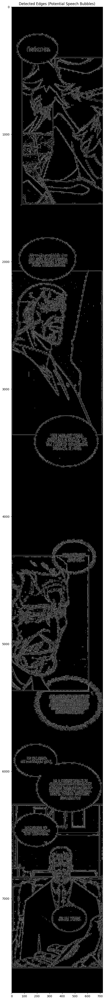

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image_path = "manga_images/page_1.jpg"
image = cv2.imread(image_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply threshold to highlight speech bubbles
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)

# Detect edges using Canny edge detection
edges = cv2.Canny(thresh, 100, 200)

# Show results
plt.figure(figsize=(100, 60))
plt.imshow(edges, cmap='gray')
plt.title("Detected Edges (Potential Speech Bubbles)")
plt.show()


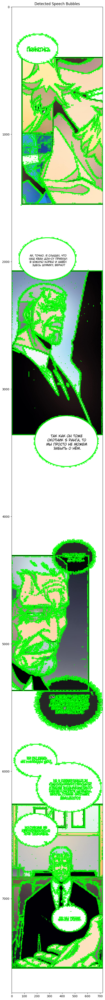

In [ ]:
# Find contours
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
output = image.copy()
cv2.drawContours(output, contours, -1, (0, 255, 0), 2)

# Show result
plt.figure(figsize=(100, 60))
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.title("Detected Speech Bubbles")
plt.show()



image 1/1 /content/manga_images/page_1.jpg: 640x64 1 person, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 64)


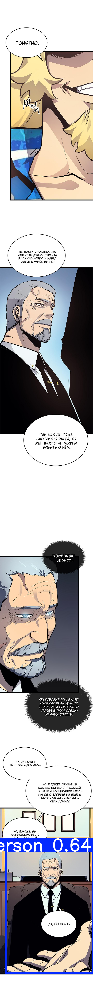

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLO model
model = YOLO("yolov8n.pt")  # Use a fine-tuned model if available

# Run object detection
results = model(image_path)

# Show detection results
results[0].show()

In [ ]:
! wget https://your-custom-model-url/yolov8_bubble.pt

--2025-02-15 13:26:43--  https://your-custom-model-url/yolov8_bubble.pt
Resolving your-custom-model-url (your-custom-model-url)... failed: Name or service not known.
wget: unable to resolve host address ‘your-custom-model-url’


In [ ]:
import torch
print(torch.version.cuda)  # Check PyTorch CUDA version
print(torch.__version__)   # Check PyTorch version

11.8
2.6.0+cu118


In [ ]:
import torch
import torchvision

print(torch.version.cuda)  # Should still be 11.8
print(torchvision.__version__)  # Should now be compatible

11.8
0.21.0+cu118


In [ ]:
pip uninstall torch torchvision torchaudio -y

Found existing installation: torch 2.5.1+cu118
Uninstalling torch-2.5.1+cu118:
  Successfully uninstalled torch-2.5.1+cu118
Found existing installation: torchvision 0.20.1+cu124
Uninstalling torchvision-0.20.1+cu124:
  Successfully uninstalled torchvision-0.20.1+cu124
Found existing installation: torchaudio 2.5.1+cu124
Uninstalling torchaudio-2.5.1+cu124:
  Successfully uninstalled torchaudio-2.5.1+cu124


In [ ]:
pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118


Looking in indexes: https://download.pytorch.org/whl/cu118
  Using cached https://download.pytorch.org/whl/cu118/torch-2.6.0%2Bcu118-cp311-cp311-linux_x86_64.whl.metadata (27 kB)
  Using cached https://download.pytorch.org/whl/triton-3.2.0-cp311-cp311-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (1.4 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 848.7/848.7 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.7/166.7 MB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 124.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 110.5 MB/s eta 0:00:00
  Attempting uninstall: triton
    Found existing installation: triton 3.1.0
    Uninstalling triton-3.1.0:
      Successfully uninstalled triton-3.1.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastai 2.7.18 requires torch<2.6,>=1.1

In [ ]:
pip install opencv-python numpy torch torchvision ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 14.8 MB/s eta 0:00:00


In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-rx3sexfj
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-rx3sexfj
  Resolved https://github.com/facebookresearch/detectron2.git to commit 9604f5995cc628619f0e4fd913453b4d7d61db3f
  Preparing metadata (setup.py) ... done
  Using cached yacs-0.1.8-py3-none-any.whl.metadata (639 bytes)
  Using cached fvcore-0.1.5.post20221221-py3-none-any.whl
  Using cached iopath-0.1.9-py3-none-any.whl.metadata (370 bytes)
  Using cached omegaconf-2.3.0-py3-none-any.whl.metadata (3.9 kB)
  Using cached hydra_core-1.3.2-py3-none-any.whl.metadata (5.5 kB)
  Using cached black-25.1.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_28_x86_64.whl.metadata (81 kB)
  Using cached antlr4_python3_runtime-4.9.3-py3-none-any.whl
  Using cached portalocker-3.1.1-py3-none-any.whl.metadata (8.6 kB)
  Using cached mypy_extensions-1.0.0-py3-non

In [ ]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118
INFO: pip is looking at multiple versions of torch to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 79.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.6/875.6 kB 62.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 97.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.9/663.9 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.9/417.9 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 MB 34.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 MB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.1/204.1 MB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 MB 4

In [ ]:
!nvidia-smi

Sat Feb 15 12:50:12 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
! pip install selenium

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 69.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 492.9/492.9 kB 30.8 MB/s eta 0:00:00


In [4]:
! pip install webdriver-manager

In [5]:
!apt-get update
!apt-get install -y wget
!wget https://dl.google.com/linux/direct/google-chrome-stable_current_amd64.deb
!apt-get install -y ./google-chrome-stable_current_amd64.deb

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,315 kB]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,655 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-up

# New Section

In [ ]:
! dotnet --version

/bin/bash: line 1: dotnet: command not found
